<a href="https://colab.research.google.com/github/CeesGniewyk/Food-Classification/blob/master/Triplet%20Network/Food_Classifications_Triplet_Network.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In this notebook the last part of the Food-Classification model is shown. 
In this notebook we will load the previously trained Efficientnet model and finetune it on the test set of the menu items that will be used that day. <br>
Any kind of data can be plugged and played around with. <br>
Be aware that the results may vary with different iterations, so you might not the same results every single time.

#Git

In [0]:
%cd /content
!git clone https://github.com/Tony607/efficientnet_keras_transfer_learning
!git clone https://github.com/CeesGniewyk/Food-Classification

/content
fatal: destination path 'efficientnet_keras_transfer_learning' already exists and is not an empty directory.
Cloning into 'Food-Classification'...
remote: Enumerating objects: 14, done.
remote: Counting objects: 100% (14/14), done.
remote: Compressing objects: 100% (13/13), done.
remote: Total 41 (delta 1), reused 9 (delta 0), pack-reused 27
Unpacking objects: 100% (41/41), done.


# Packages

Installing dependencies and useful code snippets

In [0]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
from tqdm.autonotebook import tqdm
from sklearn.metrics import confusion_matrix, accuracy_score
import tensorflow as tf
from tensorflow.keras import utils
from tensorflow.keras.models import Sequential, Model, load_model, save_model
from tensorflow.keras.preprocessing.image import load_img, ImageDataGenerator, img_to_array
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Dropout, Flatten, GlobalAveragePooling2D
from tensorflow.keras.layers import Input, Convolution2D,  AveragePooling2D, ZeroPadding2D, Reshape, Activation, concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, History
from tensorflow.python.keras.utils.data_utils import Sequence

# For plotting pandas dataframes as plotly in google colab:
def plotplease():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
  '''))
  init_notebook_mode(connected=False)

import cufflinks as cf
import plotly.offline
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

# Pickle for storing files
import pickle
def load_file(file_name):
    f = open(file_name, 'rb')
    read_file = pickle.load(f)
    print("file loaded")
    f.close()
    return read_file

def save_file(file_name, data):
    f = open(file_name, 'wb')
    pickle.dump(data, f, protocol=4)
    print(" file saved")
    f.close()

%cd /content/Food-Classification

/content/Food-Classification


#Normal Model


## Making Imagegenerator

This image generator will make augmentation to the images in the following ways:
- Rotations
- shifting the image horizontally and vertically
- zooming in
- flipping the image
- changing the brightness

In [0]:
# classes correspond to the amount of folders in the directory
categories = ['Jam Sandwich','Yoghurt','Banana','Lemon','Cookies']
num_classes = len(categories)
input_shape=(224, 224, 3)
print("Number of classes: {}".format(num_classes))

Number of classes: 5


In [0]:
train_image_generator = ImageDataGenerator(rescale=1./255,
                                           rotation_range=360,
                                           width_shift_range=0.2,
                                           height_shift_range=0.2,
                                           horizontal_flip=True,
                                           vertical_flip=True,
                                           zoom_range=0.1,
                                           brightness_range=[0.7,1.3]
                                          )
test_image_generator = ImageDataGenerator(rescale=1./255,
                                           rotation_range=360,
                                           width_shift_range=0.2,
                                           height_shift_range=0.2,
                                           horizontal_flip=True,
                                           vertical_flip=True,
                                           zoom_range=0.1,
                                          brightness_range=[0.7,1.3]
                                          )

train_data_gen = train_image_generator.flow_from_directory(batch_size=num_classes,
                                                            directory="Triplet Network/data/train/",
                                                            shuffle=False,
                                                            target_size=(224, 224),
                                                            class_mode='categorical')

test_data_gen = train_image_generator.flow_from_directory(batch_size=num_classes,
                                                          directory="Triplet Network/data/test/",
                                                          shuffle=False,
                                                          target_size=(224, 224),
                                                          class_mode='categorical')

Found 5 images belonging to 5 classes.
Found 5 images belonging to 5 classes.


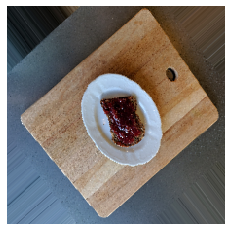

Class is: Jam Sandwich


In [0]:
#@title Showing training set example {run:"auto"}
category = 0 #@param [0,1,2,3,4] {type:"raw"}
train_images, train_image_label = next(train_data_gen)
image = train_images[category]
label = train_image_label[category]
plt.imshow(image)
plt.axis("off")
plt.show()
print("Class is: {}".format(categories[category]))

## Making Dataset using generator

In this section I make the datasets using the generator. <br>
The Triplet Dataset is made to be smaller to speed up creation of triplets.
The choice is made to make a separate dataset for convenience. <br>
The following datasets are made:


*   Training Set (1000 samples, 200 per class)
*   Test Set (500 samples, 100 per class)
*   Triplet Set (200 samples, 40 per class)




### Making Training Set

In [0]:
# Make the dataset
images_train, labels_train = next(train_data_gen)
# increase dataset size
for i in tqdm(range(0,199)):
    images_new, labels_new = next(train_data_gen)
    images_train = np.concatenate((images_train,images_new),axis=0)
    labels_train = np.concatenate((labels_train,labels_new),axis=0)

### Making Test Set

In [0]:
# Make the dataset
images_test, labels_test = next(test_data_gen)
# increase dataset size
for i in tqdm(range(0,99)):
    images_new, labels_new = next(test_data_gen)
    images_test = np.concatenate((images_test,images_new),axis=0)
    labels_test = np.concatenate((labels_test,labels_new),axis=0)

### Making set for training triplets

In [0]:
# Make the dataset
images_triplet, labels_triplet = next(train_data_gen)
# increase dataset size
for i in tqdm(range(0,39)):
    images_new, labels_new = next(train_data_gen)
    images_triplet = np.concatenate((images_triplet,images_new),axis=0)
    labels_triplet = np.concatenate((labels_triplet,labels_new),axis=0)

##Changing Pre-trained Model

A new Dense layer of 100 is added to give the model some space to create meaningful features for the last dense layer when using the model for a triplet network <br>
Currently the model has two dense layers of size 100, the last one will be used as a meaningful embedding of the input image. The first layer will be changed to reduce loss in the triplet function.

### Loading & Changing Model

In [0]:
%cd /content/efficientnet_keras_transfer_learning/
from efficientnet import EfficientNetB0 as Net
#Reconstruct model architecture
model_effinet = Net(weights="imagenet", include_top=False, input_shape=input_shape)
model = Sequential()
model.add(model_effinet)
model.add(GlobalAveragePooling2D())
model.add(Dropout(0.35))
model.add(Dense(100, activation='relu'))
model.add(Dense(11, activation='softmax'))
%cd /content/Food-Classification
#Load Weights of pre-trained model
model.load_weights("EfficientnetB0/weights_food_model")
#Remove last layer, add another embedding layer and add the correct size for classes
model.pop()
model.add(Dense(num_classes, activation='softmax'))
model.summary()

# Freeze the layers except the last 2 layers
for layer in model.layers[:-2]:
    layer.trainable = False
# Check the trainable status of the individual layers
for layer in model.layers:
    print(layer, layer.trainable)
model.compile(loss='categorical_crossentropy', optimizer= 'adam',metrics=['accuracy'])

/content/efficientnet_keras_transfer_learning
/content/Food-Classification
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
efficientnet-b0 (Model)      (None, 7, 7, 1280)        4049564   
_________________________________________________________________
global_average_pooling2d_1 ( (None, 1280)              0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 1280)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 100)               128100    
_________________________________________________________________
dense_4 (Dense)              (None, 5)                 505       
Total params: 4,178,169
Trainable params: 4,136,153
Non-trainable params: 42,016
_________________________________________________________________
<tensorflow.python.keras.engin

Checking the current performance of the model without finetuning:

In [0]:
model.evaluate(images_test,labels_test,verbose=0)[1]

0.2

As can be seen the performance is bad. (Accuracy = 20%, since there are 5 classes this is basically a random guess) <br>
 The model has been trained on the Food-11 dataset and has not been retrained for the new dataset. <br>
This will be covered in the next section

### Retraining Model

#### Using Generator (slow)
You can train the model using the generator, but we've already prepared a training set.  <br> Training with a set is faster. <br>
We will train for 100 epochs to get the model to performing perfectly on the training set.


In [0]:
history = model.fit_generator(
    generator = train_data_gen,
    steps_per_epoch=5,
    epochs=20,
    use_multiprocessing=True
)

#### Using Generated Training Set (fast)

In [0]:
history = model.fit(
    images_train,
    labels_train,
    batch_size=32,
    epochs=100,
    use_multiprocessing=True
)

Train on 1000 samples
Epoch 1/100
1000/1000 [==============================] - 3s 3ms/sample - loss: 2.5593 - acc: 0.2450
Epoch 2/100
1000/1000 [==============================] - 1s 1ms/sample - loss: 1.6829 - acc: 0.3490
Epoch 3/100
1000/1000 [==============================] - 1s 1ms/sample - loss: 1.3012 - acc: 0.5010
Epoch 4/100
1000/1000 [==============================] - 1s 1ms/sample - loss: 1.0982 - acc: 0.5980
Epoch 5/100
1000/1000 [==============================] - 1s 1ms/sample - loss: 0.9708 - acc: 0.6940
Epoch 6/100
1000/1000 [==============================] - 1s 1ms/sample - loss: 0.8829 - acc: 0.7350
Epoch 7/100
1000/1000 [==============================] - 1s 1ms/sample - loss: 0.8148 - acc: 0.7970
Epoch 8/100
1000/1000 [==============================] - 1s 1ms/sample - loss: 0.7231 - acc: 0.8220
Epoch 9/100
1000/1000 [==============================] - 1s 1ms/sample - loss: 0.6510 - acc: 0.8670
Epoch 10/100
1000/1000 [==============================] - 1s 1ms/sample - loss

## Evaluation

In [0]:
model.evaluate(images_test,labels_test,verbose=0)[1]

0.878

When evaluating the model results, we can see that it achieves an accuracy of 87.8% on the test set, even though the model performed with an accuracy of 99.6% on the training set. <br>
Let's evaluate the confidence of the model when making predictions. <br>
For every image the Model has a certain confidence when making this prediction.<br>
Have a look at the following output where we show the confidence of the training set

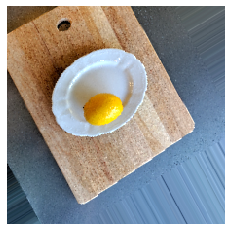

Class is: Lemon
Predicted Class is: Lemon


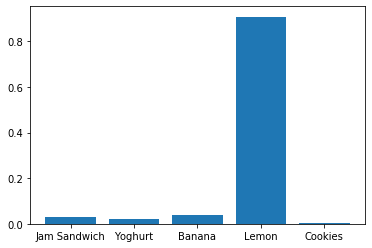

In [0]:
#@title Performance on test set generator{run:"auto"}
category = 3 #@param [0,1,2,3,4] {type:"raw"}
test_images, test_image_label = next(test_data_gen)
image = test_images[category]
label = test_image_label[category]
plt.imshow(image)
plt.axis("off")
plt.show()
print("Class is: {}".format(categories[category]))
x = np.expand_dims(test_images[category], axis=0)
prediction = model.predict(x)
plt.bar(categories,prediction[0])
print("Predicted Class is: {}".format(categories[np.argmax(prediction)]))

For some classes it is very confident about the prediction. <br>
For other classes it is less confident and even makes mistakes. <br>
In the next few cells we show the average confidence of a certain class by summerizing the confidence of each image.

### Evaluation on the confidence of the model

In [0]:
#Function to get the total average confidence
def get_confidence(dataset):
  predictions = model.predict(dataset)
  confidence = np.zeros((num_classes,num_classes))
  for i in range(len(predictions)):
    confidence[i%num_classes]+= predictions[i]
  confidence = confidence/(len(predictions)/num_classes)
  return confidence

In the following graphs the total confidence of all the training examples is shown. <br>
The top graph is for the training set, the bottom graph for the test set.<br>
Let's first inspect the training set <br>
On te right side you can select which images you'd like to inspect, the bar charts then show for that type how confident it is <br>
For example: In orange you see the average distribution of confidence for prediction for the Jam Sandwich class. You can see the yellow bar over the Jam Sandwich class which means that for all images it's very confident it's a Jam Sandwich. <br>
For the Banana class, which is represented as Green, you can see that it's not so confident about it. In the Test set you can see that overall it's more confident that Banana photo's are actually Yoghurt. <br>
Our goal would be to boost the confidence for the correct classes, because when the model will be deployed, we will be expecting more variation, but would still want the model to predict correctly. <br>


In [0]:
plotplease()
confidence_train = get_confidence(images_train)
confidence_test = get_confidence(images_test)
pd.DataFrame(confidence_train, index=categories, columns=categories).transpose().iplot(kind='bar',title="Training Set Per Category Average Guess Confidence",yTitle="Confidence",xTitle='Guessed Category')
pd.DataFrame(confidence_test, index=categories, columns=categories).transpose().iplot(kind='bar',title="Test Set Per Category Average Guess Confidence",yTitle="Confidence",xTitle='Guessed Category')

## Saving Model
Saving the model to load later

In [0]:
model.save_weights("Triplet Network/data/base_model")

# Triplet Model

A question that might arise at this point is the following: "Why don't we just keep on training the classification model until it's 100% confident?" <br>
The reason for trying a different kind of model architecture is to make the model more generalizeable to new kind of test data. <br>
If we would continue training the classification model, the model would learn to minimize the loss function. <br>
For the classification model, the loss function is categorical cross entropy, which is basically trying to be as sure as it can be about the classes. <br>
Even though this method would perfectly achieve what we'd like to achieve here, we assume that by using a different loss function the model would be more general and would make less errors when dealing with real data. <br>
<br>
The choice for the triplet network is to use metric learning as a loss function instead of categorical cross entropy. <br>
The loss function is defined as such that we make groups of images, the groups will be of size 3. <br>
Each group will have one **Anchor** image, one **Positive** and one **Negative**. <br>
These three images are all different images, but the Positive is of the same class as the Anchor, while the negative is of a different class. <br>
Since these groups consist of three images, they are called **Triplets** <br>
The layer in the neural network that comes before the classification layer is often called the **embedding** layer, because according to research it is proven that this layer embeds the information from the image in a much more compact way. <br>
Using a triplet network, we want to compare the different embeddings of the triplets and ensure that the embeddings belonging to the *anchor* and *positive* are closer to eachother than the *anchor* and *negative*. The loss occurs when the negative is closer than the positive. This model architecture ensures that similar classes are closer together. <br>
Training using this architecture should make the classification task easier.

##Recreating Model

We load the weights of the classification model into a new architecture that makes it possible to put it into a Triplet Network

In [0]:
%cd /content/efficientnet_keras_transfer_learning/
from efficientnet import EfficientNetB0 as Net
#Reconstruct model architecture
model_effinet = Net(weights="imagenet", include_top=False, input_shape=input_shape)
base_model = Sequential()
base_model.add(model_effinet)
base_model.add(GlobalAveragePooling2D())
base_model.add(Dropout(0.35))
base_model.add(Dense(100, activation='relu'))
base_model.add(Dense(5, activation='softmax'))
%cd /content/Food-Classification
#Load Weights of pre-trained model
base_model.load_weights("Triplet Network/data/base_model")
#Remove last layer, add another embedding layer and add the correct size for classes
base_model.pop()
classification_model_input = Input(input_shape)
classification_model_middle = base_model(classification_model_input)
classification_model_output = Dense(num_classes, activation='softmax')(classification_model_middle)
classification_model = Model(inputs=classification_model_input, outputs=classification_model_output)
classification_model.summary()
classification_model.layers[1].summary()
# Freeze the layers except the last 2 layers
for layer in base_model.layers[:-1]:
    layer.trainable = False
# Check the trainable status of the individual layers
for layer in base_model.layers:
    print(layer, layer.trainable)
classification_model.compile(loss='categorical_crossentropy', optimizer= 'adam',metrics=['accuracy'])

/content/efficientnet_keras_transfer_learning
/content/Food-Classification
Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
sequential_3 (Sequential)    (None, 100)               4177664   
_________________________________________________________________
dense_9 (Dense)              (None, 5)                 505       
Total params: 4,178,169
Trainable params: 4,136,153
Non-trainable params: 42,016
_________________________________________________________________
Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
efficientnet-b0 (Model)      (None, 7, 7, 1280)        4049564   
_________________________________________________________________
global_averag

## Making Triplets

We check whether the base model is in the correct format (Without the top layer) to start creating the embeddings.

In [0]:
base_model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
efficientnet-b0 (Model)      (None, 7, 7, 1280)        4049564   
_________________________________________________________________
global_average_pooling2d_3 ( (None, 1280)              0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 1280)              0         
_________________________________________________________________
dense_7 (Dense)              (None, 100)               128100    
Total params: 4,177,664
Trainable params: 128,100
Non-trainable params: 4,049,564
_________________________________________________________________


Now we use the predict function of the model to make the embeddings, as you can see 200 embeddings with each a size of 100 have been made

In [0]:
embeddings = base_model.predict(images_triplet)
embeddings.shape

(200, 100)

Here we define a function that calculates the loss so we can select the worst performing triplets for training.

In [0]:
margin = 0
def calculate_loss(anchor,positive,negative):
  distance_positive = np.sum(np.square(embeddings[anchor]-embeddings[positive]))
  distance_negative = np.sum(np.square(embeddings[anchor]-embeddings[negative]))
  loss = max(0.0,margin + distance_positive-distance_negative)
  return loss

In the following cell we make all the possible combination of triplets. By looping through the whole dataset.

In [0]:
# make the possible triplets
a = list()
b = list()
for i in tqdm(range(len(labels_triplet))):
  for j in range(len(labels_triplet)):
    if i!=j:
      if i%num_classes == j%num_classes:
        for k in range(len(labels_triplet)):
            if i%num_classes == k%num_classes:
              continue
            a.append([i,j,k])
            b.append(calculate_loss(i,j,k))

a = np.array(a)
b = np.array(b)

Here the error is calculated, the triplets are sorted from highest error to lowest. <br>
The triplets with the largest error are the ones with the largest distance between the anchor and positive, compared to the anchor and negative. <br>
These are chosen because it will speed up training by looking at the points where the model fails.

In [0]:
# Sort the triplets highest error first
error = (-b).argsort()
sortedtriplet = a[error]
print("Amount of Triplets = {}".format(len(sortedtriplet)))
print("Sorted Triplets:")
print(sortedtriplet[0:10])
print("Sorted Error:")
print(b[error][0:10])
triplet_train = sortedtriplet[0:1000]

Amount of Triplets = 1248000
Sorted Triplets:
[[ 59 109 141]
 [ 59 109  91]
 [ 59 109 148]
 [ 59 109  42]
 [ 59 109  71]
 [ 59 109 193]
 [ 59 109 112]
 [ 59 109 167]
 [ 59 109 108]
 [ 59 109 183]]
Sorted Error:
[173.84769821 170.72733879 169.91413116 169.58965874 169.22938919
 166.86536789 166.19711304 163.57478714 163.33158875 162.39839172]


In the following cell we show the worst performing triplet.

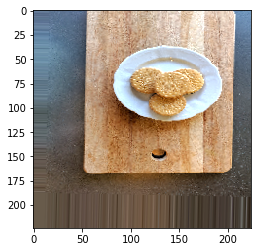

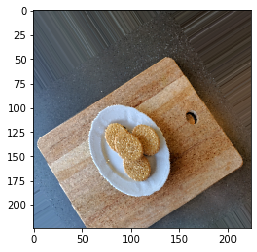

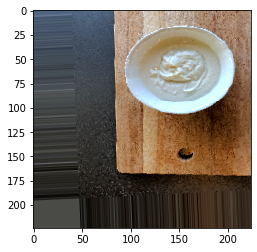

In [0]:
#Anchor, Positive,  Negative
# This is the worst performing triplet, meaning that the negative is closer to the anchor than the positive is
x,y,z = sortedtriplet[0]
plt.imshow(images_triplet[x])
plt.show()
plt.imshow(images_triplet[y])
plt.show()
plt.imshow(images_triplet[z])
plt.show()

The following function formats the triplets so the model can work with it.

In [0]:
h,w,d = input_shape
anchors = np.zeros((len(triplet_train), h, w, d))
positives = np.zeros((len(triplet_train), h, w, d))
negatives = np.zeros((len(triplet_train), h, w, d))
triplets_labels = np.zeros((len(triplet_train), 3,5))
for i in tqdm(range(len(triplet_train))):
  anchors[i] = images_triplet[triplet_train[i][0]]
  positives[i] = images_triplet[triplet_train[i][1]]
  negatives[i] = images_triplet[triplet_train[i][2]]
  triplets_labels[i][0] = labels_triplet[triplet_train[i][0]]
  triplets_labels[i][1] = labels_triplet[triplet_train[i][1]]
  triplets_labels[i][2] = labels_triplet[triplet_train[i][2]]
triplet_model_input = [anchors,positives,negatives]

NameError: ignored

## Define Triplet Loss

In the following cell the triplet loss is defined.

In [0]:
def triplet_loss(ground_truth, network_output):

    anchor, positive, negative = tf.split(network_output, num_or_size_splits=3, axis=1)        
    
    for embedding in [anchor, positive, negative]:
        embedding = tf.math.l2_normalize(embedding)

    pos_dist = tf.reduce_sum(tf.square(tf.subtract(anchor, positive)), axis=1)
    neg_dist = tf.reduce_sum(tf.square(tf.subtract(anchor, negative)), axis=1)
    
    margin = 0.4 # define your margin
    basic_loss = tf.add(tf.subtract(pos_dist, neg_dist), margin)
    loss = tf.reduce_mean(tf.maximum(basic_loss, 0.0), axis=0)

    return loss

## Make Triplet Model

In the following cell the triplet architecture is made. <br>
The model takes in three images, computes the embeddings for each of them and compares them to create the loss. <br> 
It does this by copying the classification model's architecture three times and sharing weights among these.
Afterwards the loss is forwarded back through the model, where each model has it's weights updated (although these are shared). <br>
In the cell you see the three different inputs are attached to the same base_model, this ensures that the weights are shared. It's not actually making a copy, it's just connecting to the same model in different configurations.

In [0]:
anchor_input = Input(input_shape)
positive_input = Input(input_shape)
negative_input = Input(input_shape)

encoded_anchor = base_model(anchor_input)
encoded_positive = base_model(positive_input)
encoded_negative = base_model(negative_input)

merged_vector = concatenate([encoded_anchor, encoded_positive, encoded_negative], axis=-1, name='merged_layer')

triplet_model = Model(inputs=[anchor_input,positive_input, negative_input], outputs=merged_vector)
triplet_model.compile(loss=triplet_loss, optimizer="adam")
triplet_model.summary()

Model: "model_6"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_9 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
input_10 (InputLayer)           [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
input_11 (InputLayer)           [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
sequential_3 (Sequential)       (None, 100)          4177664     input_9[0][0]                    
                                                                 input_10[0][0]             

In [0]:
history = triplet_model.fit(
    triplet_model_input,
    triplets_labels,
    batch_size=32,
    epochs=10,
    use_multiprocessing=True
)

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 1000 samples
Epoch 1/5
1000/1000 [==============================] - 13s 13ms/sample - loss: 1.0986
Epoch 2/5
1000/1000 [==============================] - 5s 5ms/sample - loss: 0.0928
Epoch 3/5
1000/1000 [==============================] - 5s 5ms/sample - loss: 0.0761
Epoch 4/5
1000/1000 [==============================] - 5s 5ms/sample - loss: 0.0257
Epoch 5/5
1000/1000 [==============================] - 5s 5ms/sample - loss: 0.0505


After 5 epochs of training on the triplets, you can see that the loss has already decreased heavily. <br>
We stop training after 5 epochs because the model has figured out a way to minimize the loss for the selected triplets. <br>
Now it would be wise to create new triplets with the updated model and repeat the process for a couple of iterations. <br>
First we will see the effect on the confidence of the model, when the model has not be funetuned for classification.<br>
The architecture has been defined as such that the classificaton model can make predictions right way. (This is one of the benefits from using the functional api of keras over the sequential one)

## Check Confidence

In [0]:
def get_confidence_triplet(dataset):
  predictions = classification_model.predict(dataset)
  confidence = np.zeros((num_classes,num_classes))
  for i in range(len(predictions)):
    confidence[i%num_classes]+= predictions[i]
  confidence = confidence/(len(predictions)/num_classes)
  return confidence

In [0]:
plotplease()
confidence_train = get_confidence_triplet(images_train)
confidence_test = get_confidence_triplet(images_test)
pd.DataFrame(confidence_train, index=categories, columns=categories).transpose().iplot(kind='bar',title="Training Set Per Category Average Guess Confidence",yTitle="Confidence",xTitle='Guessed Category')
pd.DataFrame(confidence_test, index=categories, columns=categories).transpose().iplot(kind='bar',title="Test Set Per Category Average Guess Confidence",yTitle="Confidence",xTitle='Guessed Category')

As you can see the model is performing worse on the classification task! <br>
Luckily this is no surprise as the model should now be retuned for the classification task again. <br>
We train the model for 10 epochs to have the accuracy back to 100% and see the difference with before.

In [0]:
history = classification_model.fit(
    images_train,
    labels_train,
    batch_size=32,
    epochs=10,
    use_multiprocessing=True
)

Train on 1000 samples
Epoch 1/10
1000/1000 [==============================] - 3s 3ms/sample - loss: 0.4209 - acc: 0.8910
Epoch 2/10
1000/1000 [==============================] - 1s 1ms/sample - loss: 0.0373 - acc: 0.9950
Epoch 3/10
1000/1000 [==============================] - 1s 1ms/sample - loss: 0.0220 - acc: 0.9970
Epoch 4/10
1000/1000 [==============================] - 1s 1ms/sample - loss: 0.0175 - acc: 0.9990
Epoch 5/10
1000/1000 [==============================] - 1s 1ms/sample - loss: 0.0162 - acc: 0.9970
Epoch 6/10
1000/1000 [==============================] - 2s 2ms/sample - loss: 0.0124 - acc: 0.9980
Epoch 7/10
1000/1000 [==============================] - 1s 1ms/sample - loss: 0.0081 - acc: 0.9990
Epoch 8/10
1000/1000 [==============================] - 1s 1ms/sample - loss: 0.0102 - acc: 0.9980
Epoch 9/10
1000/1000 [==============================] - 1s 1ms/sample - loss: 0.0097 - acc: 0.9970
Epoch 10/10
1000/1000 [==============================] - 1s 1ms/sample - loss: 0.0057 -

In [0]:
plotplease()
confidence_train = get_confidence_triplet(images_train)
confidence_test = get_confidence_triplet(images_test)
pd.DataFrame(confidence_train, index=categories, columns=categories).transpose().iplot(kind='bar',title="Training Set Per Category Average Guess Confidence",yTitle="Confidence",xTitle='Guessed Category')
pd.DataFrame(confidence_test, index=categories, columns=categories).transpose().iplot(kind='bar',title="Test Set Per Category Average Guess Confidence",yTitle="Confidence",xTitle='Guessed Category')

It can be seen that the model has an overall confidence that is higher than before, there is a slight improvement in how the test set is performing. <br>
You can see that Bananas are being classified better now. <br>
However for better results, it would be good to find the worst performing triplets on the current model and run the cycle again. For this we've made the following script below that does this when you run the cells sequentially. <br>
After about 3 cycle we started to get to useful results.

### Script

In [0]:
embeddings = base_model.predict(images_triplet)
# make the possible triplets
a = list()
b = list()
for i in tqdm(range(len(labels_triplet))):
  for j in range(len(labels_triplet)):
    if i!=j:
      if i%num_classes == j%num_classes:
        for k in range(len(labels_triplet)):
            if i%num_classes == k%num_classes:
              continue
            a.append([i,j,k])
            b.append(calculate_loss(i,j,k))

a = np.array(a)
b = np.array(b)
error = (-b).argsort()
sortedtriplet = a[error]
triplet_train = sortedtriplet[0:1000]
h,w,d = input_shape
anchors = np.zeros((len(triplet_train), h, w, d))
positives = np.zeros((len(triplet_train), h, w, d))
negatives = np.zeros((len(triplet_train), h, w, d))
triplets_labels = np.zeros((len(triplet_train), 3,5))
for i in tqdm(range(len(triplet_train))):
  anchors[i] = images_triplet[triplet_train[i][0]]
  positives[i] = images_triplet[triplet_train[i][1]]
  negatives[i] = images_triplet[triplet_train[i][2]]
  triplets_labels[i][0] = labels_triplet[triplet_train[i][0]]
  triplets_labels[i][1] = labels_triplet[triplet_train[i][1]]
  triplets_labels[i][2] = labels_triplet[triplet_train[i][2]]
triplet_model_input = [anchors,positives,negatives]
history = triplet_model.fit(
    triplet_model_input,
    triplets_labels,
    batch_size=32,
    epochs=10,
    use_multiprocessing=True
)
history = classification_model.fit(
    images_train,
    labels_train,
    batch_size=32,
    epochs=10,
    use_multiprocessing=True
)

Train on 1000 samples
Epoch 1/5
1000/1000 [==============================] - 6s 6ms/sample - loss: 0.5089
Epoch 2/5
1000/1000 [==============================] - 6s 6ms/sample - loss: 0.0641
Epoch 3/5
1000/1000 [==============================] - 6s 6ms/sample - loss: 0.0666
Epoch 4/5
1000/1000 [==============================] - 6s 6ms/sample - loss: 0.0127
Epoch 5/5
1000/1000 [==============================] - 6s 6ms/sample - loss: 0.0206


Train on 1000 samples
Epoch 1/5
1000/1000 [==============================] - 2s 2ms/sample - loss: 0.0182 - acc: 0.9980
Epoch 2/5
1000/1000 [==============================] - 2s 2ms/sample - loss: 0.0076 - acc: 1.0000
Epoch 3/5
1000/1000 [==============================] - 2s 2ms/sample - loss: 0.0044 - acc: 1.0000
Epoch 4/5
1000/1000 [==============================] - 2s 2ms/sample - loss: 0.0036 - acc: 1.0000
Epoch 5/5
1000/1000 [==============================] - 2s 2ms/sample - loss: 0.0040 - acc: 1.0000


In [0]:
plotplease()
confidence_train = get_confidence_triplet(images_train)
confidence_test = get_confidence_triplet(images_test)
pd.DataFrame(confidence_train, index=categories, columns=categories).transpose().iplot(kind='bar',title="Training Set Per Category Average Guess Confidence",yTitle="Confidence",xTitle='Guessed Category')
pd.DataFrame(confidence_test, index=categories, columns=categories).transpose().iplot(kind='bar',title="Test Set Per Category Average Guess Confidence",yTitle="Confidence",xTitle='Guessed Category')

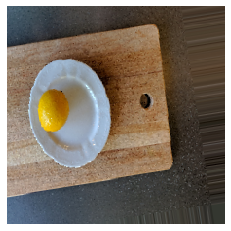

Class is: Lemon
Predicted Class is: Lemon


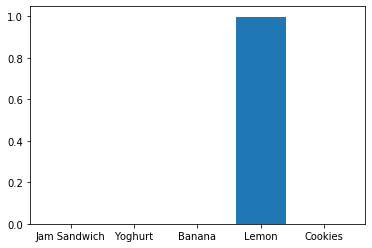

In [0]:
#@title Performance on test set generator{run:"auto"}
category = 3 #@param [0,1,2,3,4] {type:"raw"}
test_images, test_image_label = next(test_data_gen)
image = test_images[category]
label = test_image_label[category]
plt.imshow(image)
plt.axis("off")
plt.show()
print("Class is: {}".format(categories[category]))
x = np.expand_dims(test_images[category], axis=0)
prediction = classification_model.predict(x)
plt.bar(categories,prediction[0])
print("Predicted Class is: {}".format(categories[np.argmax(prediction)]))

In [0]:
classification_model.evaluate(images_test,labels_test,verbose=0)[1]

0.988

## Savings Weights

When the results are satisfying enough, the base model can be saved and the model can be extracted to be used on the raspberry pi.

In [0]:
base_model.save_weights("Triplet Model/data/triplet_trained_model")